In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import argparse
import utils
import matplotlib.pyplot as plt
from models.vqvae import VQVAE
import torchvision.transforms as transforms
parser = argparse.ArgumentParser()

"""
Hyperparameters
"""
timestamp = utils.readable_timestamp()

parser.add_argument("--batch_size", type=int, default=32)
parser.add_argument("--n_updates", type=int, default=5000)
parser.add_argument("--n_hiddens", type=int, default=128)
parser.add_argument("--n_residual_hiddens", type=int, default=32)
parser.add_argument("--n_residual_layers", type=int, default=2)
parser.add_argument("--embedding_dim", type=int, default=64)
parser.add_argument("--n_embeddings", type=int, default=512)
parser.add_argument("--beta", type=float, default=.25)
parser.add_argument("--learning_rate", type=float, default=3e-4)
parser.add_argument("--log_interval", type=int, default=50)
parser.add_argument("--dataset",  type=str, default='CIFAR10')

# whether or not to save model
parser.add_argument("-save", action="store_true")
parser.add_argument("--filename",  type=str, default=timestamp)

args = parser.parse_args(args=["-save", "--log_interval=10000","--n_updates=%d"%(500000), "--filename=imagenet"+timestamp,"--dataset=imagenet"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if args.save:
    print('Results will be saved in ./results/vqvae_' + args.filename + '.pth')
    !mkdir results -p

/home/chenningcong/Desktop/Deeplearning/deep/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Results will be saved in ./results/vqvae_imagenetmon_mar_4_17_57_55_2024.pth


In [2]:
import importlib 
import utils
importlib.reload(utils)

<module 'utils' from '/home/chenningcong/Desktop/Deeplearning/autoencoder/vqvae/utils.py'>

In [3]:
class InGPUDataset(torch.utils.data.Dataset):
    def __init__(self, dataset):
        self.dataset = dataset
        self.data = (torch.stack([i[0] for i in dataset]).to(device), torch.tensor([i[1] for i in dataset]).to(device))
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, i):
        return self.data[0][i], self.data[1][i]
class ImageNet(torch.utils.data.Dataset):
    def __init__(self):
        self.images = torch.tensor(np.load("data/tiny-imagenet/image.npy")).to(device)
        with torch.no_grad():
            self.images = (2/255)*self.images.permute((0, 3,1,2)) - 1 
        torch.cuda.empty_cache()
        self.labels = torch.tensor(np.load("data/tiny-imagenet/label.npy")).to(device)
    def __len__(self):
        return self.images.shape[0]
    def __getitem__(self, i):
        return self.images[i], self.labels[i]
def load_data_and_data_loaders_cifar(dataset, batch_size):
    training_data, validation_data = utils.load_cifar()
    x_train_var = np.var(training_data.data)
    training_data = InGPUDataset(training_data)
    validation_data = InGPUDataset(validation_data)
    training_loader, validation_loader = utils.data_loaders(
        training_data, validation_data, batch_size)
    return training_data, validation_data, training_loader, validation_loader, x_train_var

def load_data_and_data_loaders_imagenet(dataset, batch_size):
    train_size = int(0.95 * len(full_dataset))
    test_size = len(full_dataset) - train_size
    training_data, validation_data = torch.utils.data.random_split(full_dataset, [train_size, test_size])
    x_train_var = torch.var(full_dataset.images)
    training_data = InGPUDataset(training_data)
    validation_data = InGPUDataset(validation_data)
    training_loader, validation_loader = utils.data_loaders(
        training_data, validation_data, batch_size)
    return training_data, validation_data, training_loader, validation_loader, x_train_var
training_data, validation_data, training_loader, validation_loader, x_train_var = load_data_and_data_loaders_imagenet(
    args.dataset, args.batch_size)

In [5]:
full_dataset = ImageNet()

In [10]:
from tqdm import tqdm
import models
from models.decoder import Decoder
from models.encoder import Encoder
from models.quantizer import VectorQuantizer
from models.residual import *
class TopEncoder(nn.Module):
    """
    This is the q_theta (z|x) network. Given a data sample x q_theta 
    maps to the latent space x -> z.

    For a VQ VAE, q_theta outputs parameters of a categorical distribution.

    Inputs:
    - in_dim : the input dimension
    - h_dim : the hidden layer dimension
    - res_h_dim : the hidden dimension of the residual block
    - n_res_layers : number of layers to stack

    """

    def __init__(self, in_dim, h_dim, n_res_layers, res_h_dim):
        super().__init__()
        kernel = 4
        stride = 2
        self.conv_stack = nn.Sequential(
            nn.Conv2d(in_dim, h_dim, kernel_size=kernel,
                      stride=stride, padding=1),
            nn.ReLU(),
            nn.Conv2d(h_dim, h_dim, kernel_size=kernel-1,
                      stride=stride-1, padding=1),
            ResidualStack(
                h_dim, h_dim, res_h_dim, n_res_layers)

        )

    def forward(self, x):
        return self.conv_stack(x)

class TopDecoder(nn.Module):
    """
    This is the p_phi (x|z) network. Given a latent sample z p_phi 
    maps back to the original space z -> x.

    Inputs:
    - in_dim : the input dimension
    - h_dim : the hidden layer dimension
    - res_h_dim : the hidden dimension of the residual block
    - n_res_layers : number of layers to stack

    """

    def __init__(self, in_dim, h_dim, n_res_layers, res_h_dim):
        super().__init__()
        kernel = 4
        stride = 2

        self.inverse_conv_stack = nn.Sequential(
            nn.ConvTranspose2d(
                in_dim, h_dim//2, kernel_size=kernel-1, stride=stride-1, padding=1),
            ResidualStack(h_dim//2, h_dim//2, res_h_dim, n_res_layers),
            nn.ConvTranspose2d(h_dim//2, h_dim, kernel_size=kernel,
                               stride=stride, padding=1)
        )

    def forward(self, x):
        return self.inverse_conv_stack(x)


class TopStraightDecoder(nn.Module):
    """
    This is the p_phi (x|z) network. Given a latent sample z p_phi 
    maps back to the original space z -> x.

    Inputs:
    - in_dim : the input dimension
    - h_dim : the hidden layer dimension
    - res_h_dim : the hidden dimension of the residual block
    - n_res_layers : number of layers to stack

    """

    def __init__(self, in_dim, h_dim, n_res_layers, res_h_dim):
        super().__init__()
        kernel = 4
        stride = 2

        self.inverse_conv_stack = nn.Sequential(
            nn.ConvTranspose2d(
                in_dim, h_dim//2, kernel_size=kernel-1, stride=stride-1, padding=1),
            ResidualStack(h_dim//2, h_dim//2, res_h_dim, n_res_layers),
            nn.ConvTranspose2d(h_dim//2, h_dim, kernel_size=kernel,
                               stride=stride, padding=1)
        )

    def forward(self, x):
        return self.inverse_conv_stack(x)
class VQVAE2(torch.nn.Module):
    def __init__(self, h_dim, res_h_dim, n_res_layers,
                 n_embeddings, embedding_dim, beta, save_img_embedding_map=False):
        super().__init__()

        self.bottom_encoder = Encoder(3, h_dim, n_res_layers, res_h_dim)
        self.bottom_decoder = Decoder(2*embedding_dim, h_dim, n_res_layers, res_h_dim)
        self.top_encoder = TopEncoder(h_dim, 2 * h_dim, n_res_layers, 2 * res_h_dim)
        self.top_decoder = TopDecoder(embedding_dim, h_dim, n_res_layers, 2 * res_h_dim)
        # used for generation
        self.top_decoder2 = nn.ConvTranspose2d(
                embedding_dim, embedding_dim, kernel_size=4, stride=2, padding=1)
        # encode image into continuous latent space
        self.encoder = Encoder(3, h_dim, n_res_layers, res_h_dim)
        self.pre_quantization_conv_bottom = nn.Conv2d(
            2*h_dim, embedding_dim, kernel_size=1, stride=1)
        self.pre_quantization_conv_top = nn.Conv2d(
            2*h_dim, embedding_dim, kernel_size=1, stride=1)
        # pass continuous latent vector through discretization bottleneck
        self.top_vector_quantization = VectorQuantizer(
            n_embeddings, embedding_dim, beta)
        self.bottom_vector_quantization = VectorQuantizer(
            n_embeddings, embedding_dim, beta)
        # decode the discrete latent representation

        if save_img_embedding_map:
            self.img_to_embedding_map = {i: [] for i in range(n_embeddings)}
        else:
            self.img_to_embedding_map = None
    def debug_locals(self, ls):
        import pprint
        pprint.pprint(({i:ls[i].shape for i in ls if torch.is_tensor(ls[i])}))
    def forward(self, x, verbose=False):

        z_be = self.bottom_encoder(x)
        z_te = self.top_encoder(z_be)
        embedding_loss_top, z_tq, perplexity_top, _, _ = self.top_vector_quantization(self.pre_quantization_conv_top(z_te))
        z_td = self.top_decoder(z_tq)
        z_be = torch.cat([z_be, z_td], dim=1).to(device)
        embedding_loss_bottom, z_bq, perplexity_bottom, _, _ = self.bottom_vector_quantization(self.pre_quantization_conv_bottom(z_be))
        # we combine two encoding map
        
        z_bq = torch.cat([z_bq, self.top_decoder2(z_tq)], dim=1).to(device)
        output = self.bottom_decoder(z_bq)
        return embedding_loss_bottom + embedding_loss_top, output, perplexity_bottom + perplexity_top
    def get_encode(self, x, verbose=False):
        with torch.no_grad():
            z_be = self.bottom_encoder(x)
            z_te = self.top_encoder(z_be)
            embedding_loss_top, z_tq, perplexity_top, _, z_tq_indices = self.top_vector_quantization(self.pre_quantization_conv_top(z_te))
            z_td = self.top_decoder(z_tq)
            z_be = torch.cat([z_be, z_td], dim=1).to(device)
            embedding_loss_bottom, z_bq, perplexity_bottom, _, z_bq_indices = self.bottom_vector_quantization(self.pre_quantization_conv_bottom(z_be))
            return z_tq_indices, z_bq_indices
    def get_decode(self, z_tq, z_bq):
        with torch.no_grad():
            z_tq = self.top_vector_quantization.embedding(z_tq).view((1,8,8,-1)).permute((0,3,1,2))
            z_bq = self.bottom_vector_quantization.embedding(z_bq).view((1,16,16,-1)).permute((0,3,1,2))
            z_bq = torch.cat([z_bq, self.top_decoder2(z_tq)], dim=1).to(device)
            output = self.bottom_decoder(z_bq)
            return output
        
!rm runs/* -rf
model = VQVAE2(args.n_hiddens, args.n_residual_hiddens,
              args.n_residual_layers, args.n_embeddings, args.embedding_dim, args.beta).to(device)
model.load_state_dict(torch.load("results/vqvae_data_imagenetmon_mar_4_16_00_04_2024.pth")["model"])

<All keys matched successfully>

In [11]:
!mkdir plot -p
def show_image(n_iter, id = 8, clip=False):
    f, axarr = plt.subplots(2, id, figsize=(id*4, 8))
    model.eval()
    scale_img = lambda x : (x+1)/2
    for i in range(0, id):
        data = training_data[i][0]
        axarr[0][i].axis("off")
        axarr[0][i].imshow(scale_img(data.permute((1,2,0)).cpu().detach().numpy()))
        with torch.no_grad():
            _, output, _ = model(data.unsqueeze(0).to(device))
        if clip:
            output = torch.clip(output, min=-1,max=1)
        output = scale_img(output)
        output = output.squeeze(0).permute((1,2,0)).cpu().detach().numpy()
        axarr[1][i].axis("off")
        axarr[1][i].imshow(output)
    f.suptitle("Face plot"+str(n_iter))
    plt.savefig("plot/"+type(model).__name__ + str(n_iter) + ".png")
    plt.show()

  0%|                                          | 0/500000 [00:00<?, ?it/s]

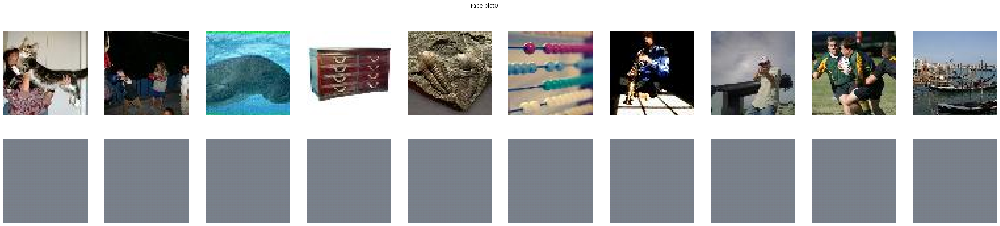

  0%|                    | 993/500000 [00:13<1:44:46, 79.37it/s, saving=0]

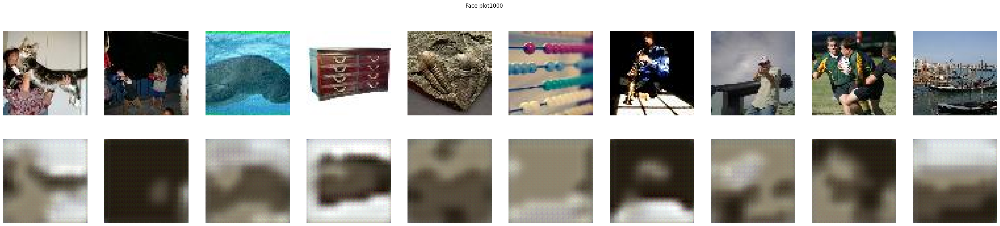

  0%|                   | 2000/500000 [00:26<1:49:04, 76.09it/s, saving=0]

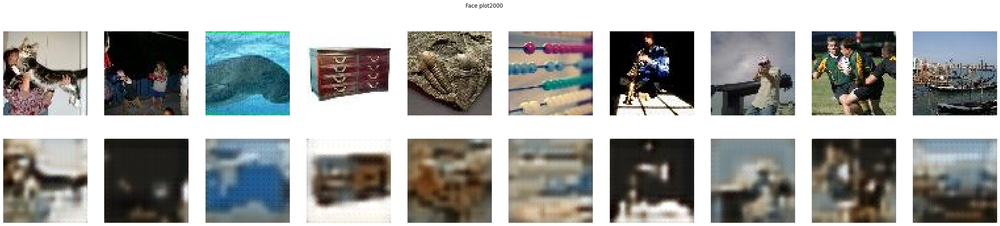

  1%|                   | 2993/500000 [00:39<1:50:04, 75.26it/s, saving=0]

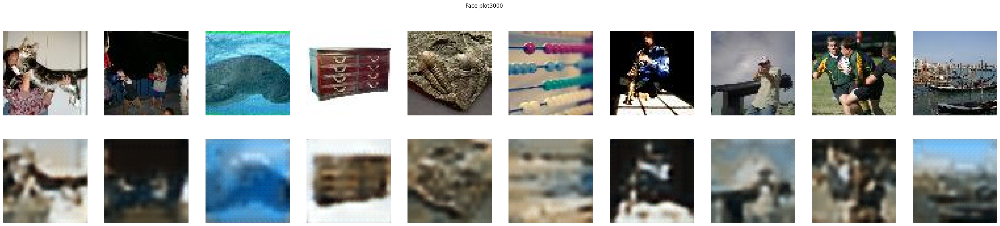

  1%|▏                  | 4000/500000 [00:53<1:56:25, 71.01it/s, saving=0]

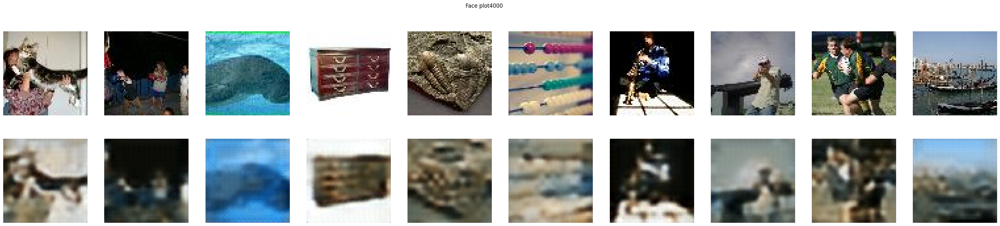

  1%|▏                  | 4995/500000 [01:06<1:40:27, 82.13it/s, saving=0]

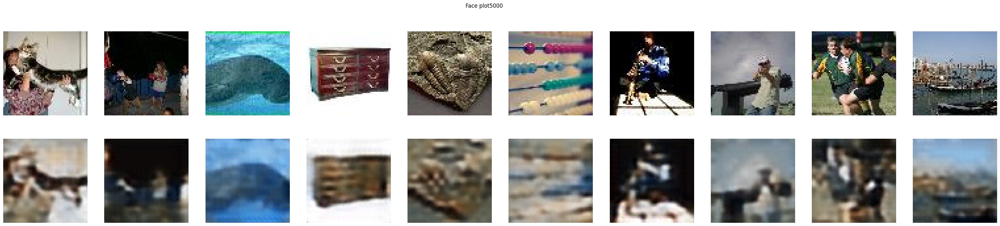

  1%|▏                  | 6000/500000 [01:19<1:40:29, 81.93it/s, saving=0]

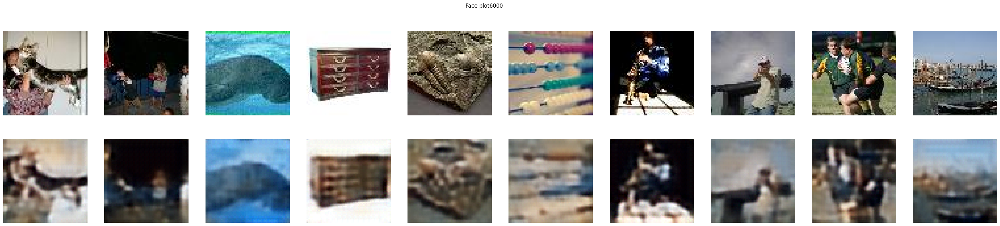

  1%|▎                  | 6998/500000 [01:33<1:40:37, 81.66it/s, saving=0]

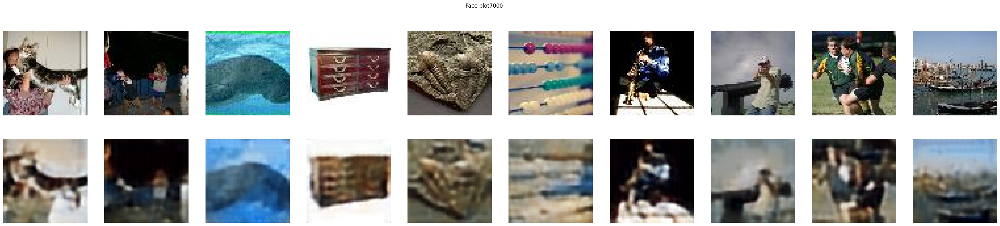

  2%|▎                  | 7993/500000 [01:46<1:46:37, 76.91it/s, saving=0]

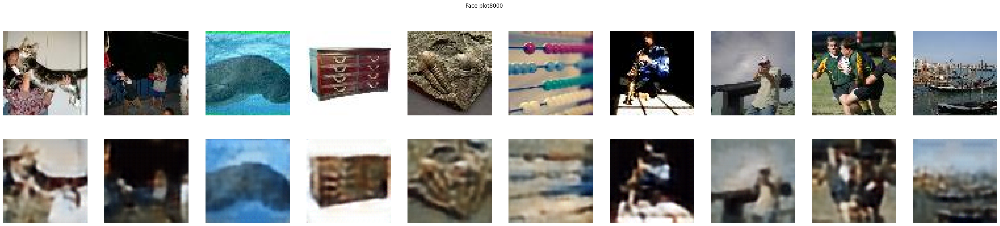

  2%|▎                  | 8995/500000 [01:59<1:37:53, 83.60it/s, saving=0]

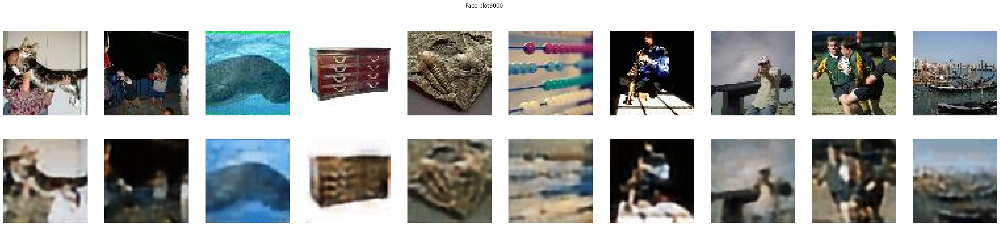

  2%|▍                  | 9993/500000 [02:11<1:39:49, 81.81it/s, saving=0]

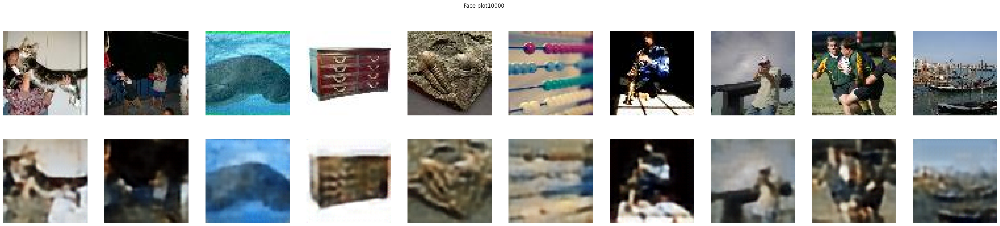

  2%|▎              | 10996/500000 [02:25<1:42:07, 79.80it/s, saving=1e+4]

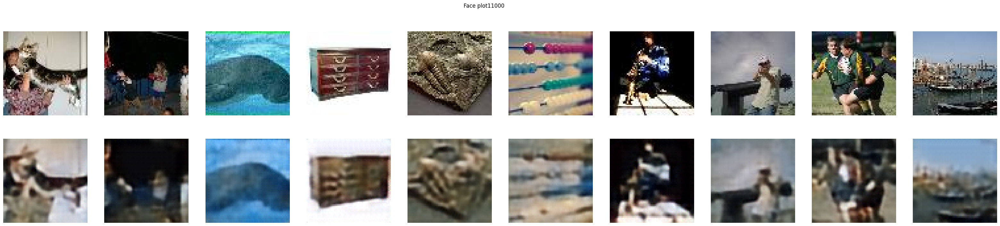

  2%|▎              | 12000/500000 [02:38<1:47:10, 75.88it/s, saving=1e+4]

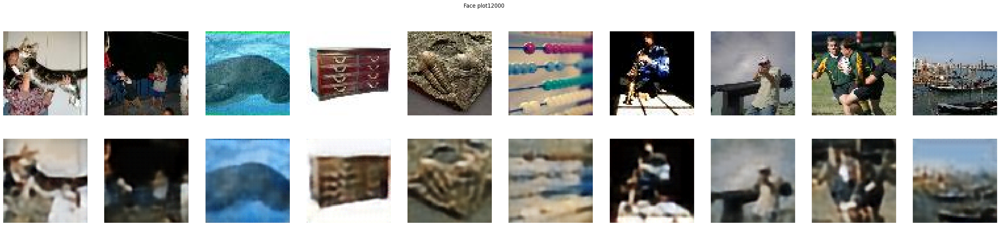

  3%|▍              | 12996/500000 [02:51<1:43:51, 78.15it/s, saving=1e+4]

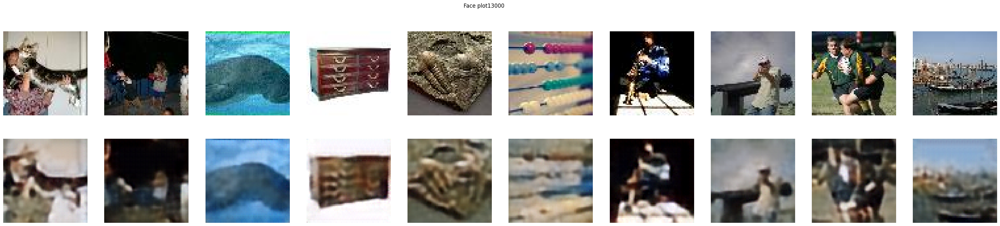

  3%|▍              | 13994/500000 [03:04<1:39:27, 81.45it/s, saving=1e+4]

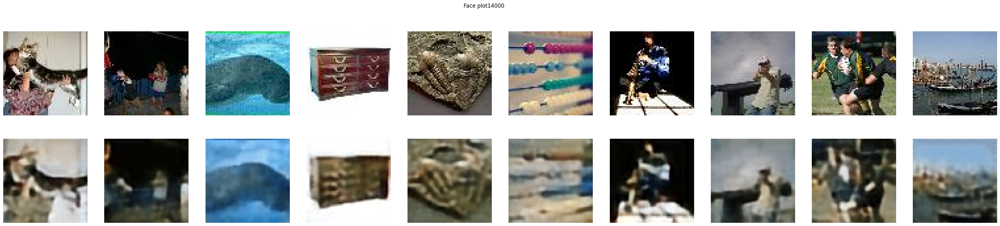

  3%|▍              | 14996/500000 [03:18<1:45:30, 76.62it/s, saving=1e+4]

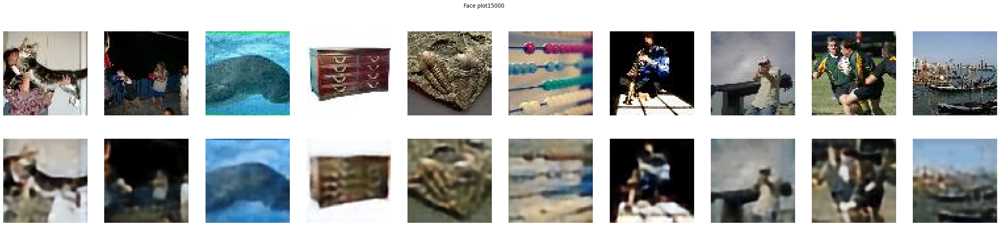

  3%|▍              | 16000/500000 [03:31<1:42:56, 78.37it/s, saving=1e+4]

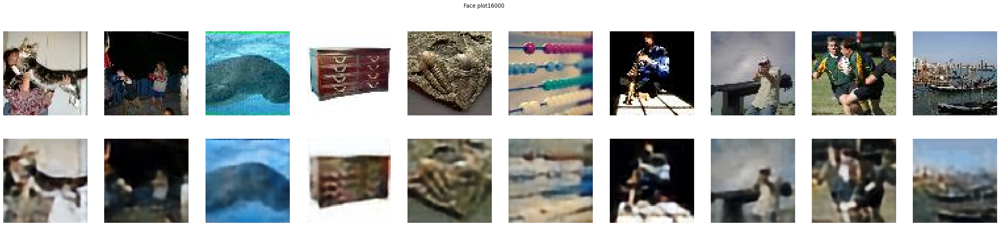

  3%|▌              | 16993/500000 [03:43<1:43:53, 77.48it/s, saving=1e+4]

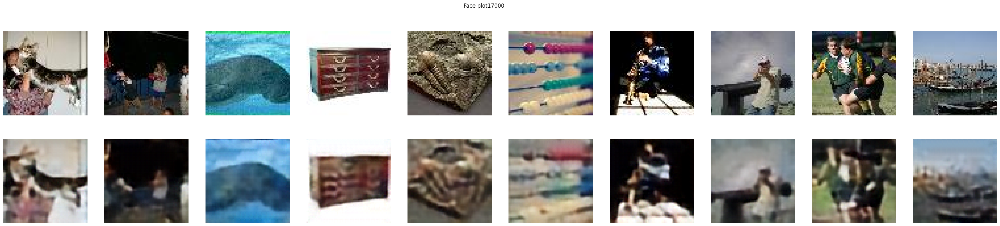

  4%|▌              | 17998/500000 [03:56<1:42:42, 78.22it/s, saving=1e+4]

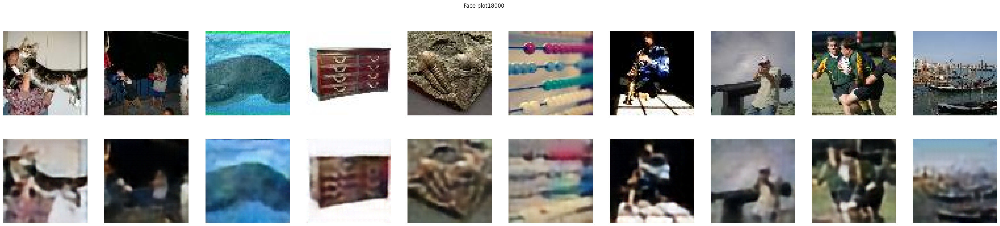

  4%|▌              | 18993/500000 [04:09<1:44:50, 76.47it/s, saving=1e+4]

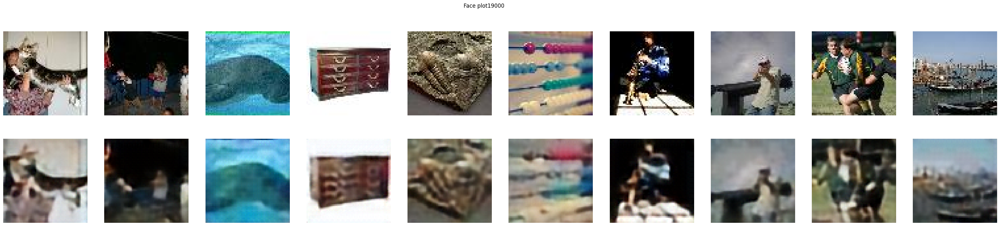

  4%|▌              | 20000/500000 [04:23<1:41:45, 78.62it/s, saving=1e+4]

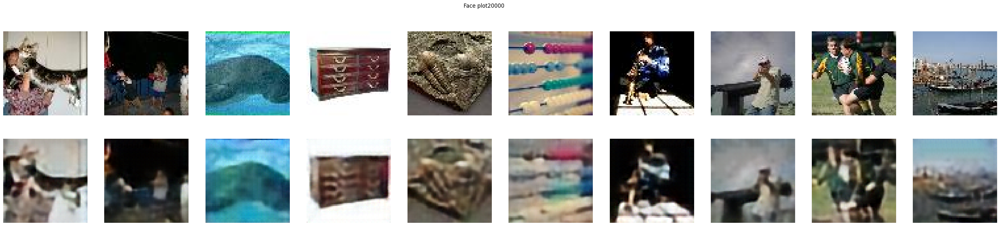

  4%|▋              | 20992/500000 [04:36<1:38:57, 80.68it/s, saving=2e+4]

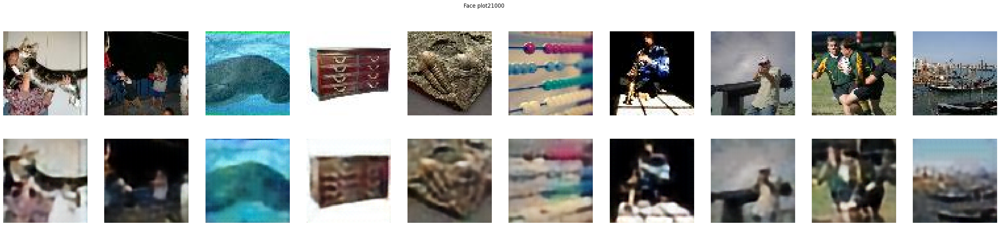

  4%|▋              | 21998/500000 [04:49<1:38:39, 80.75it/s, saving=2e+4]

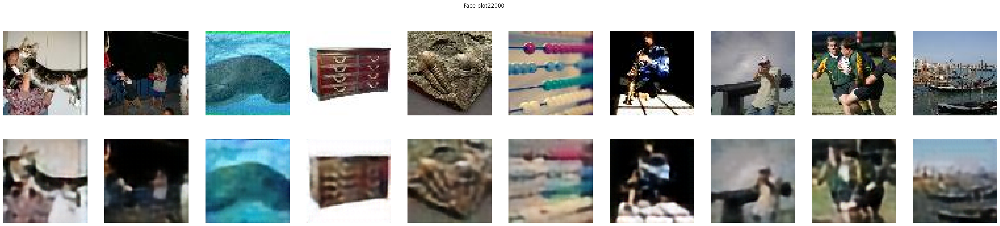

  5%|▋              | 22994/500000 [05:02<1:38:56, 80.35it/s, saving=2e+4]

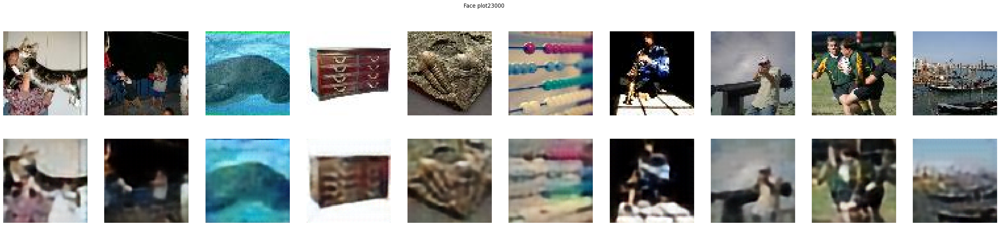

  5%|▋              | 23995/500000 [05:15<1:36:15, 82.42it/s, saving=2e+4]

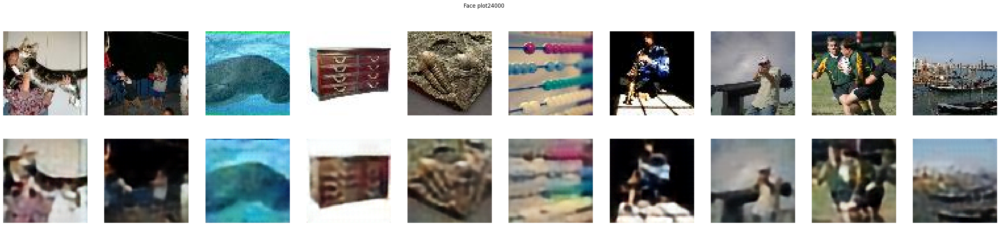

  5%|▋              | 24997/500000 [05:28<1:45:05, 75.33it/s, saving=2e+4]

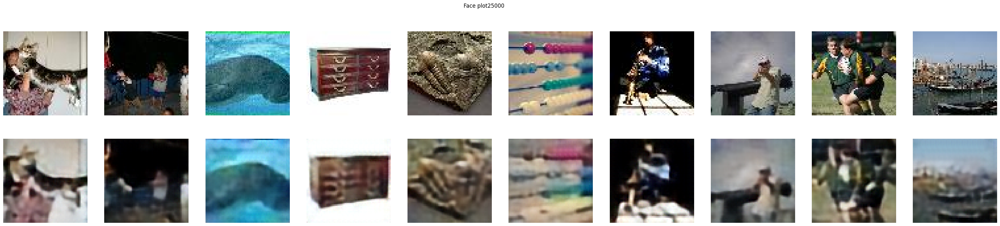

  5%|▊              | 25997/500000 [05:41<1:37:11, 81.28it/s, saving=2e+4]

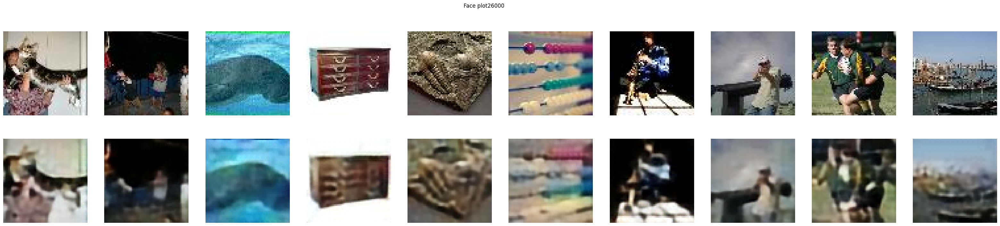

  5%|▊              | 26996/500000 [05:54<1:39:18, 79.39it/s, saving=2e+4]

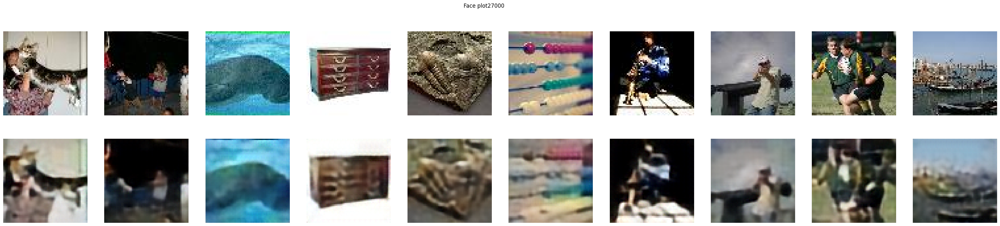

  6%|▊              | 27999/500000 [06:07<1:36:53, 81.19it/s, saving=2e+4]

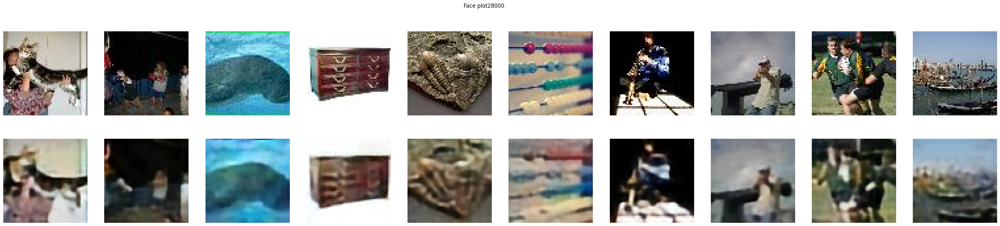

  6%|▊              | 28996/500000 [06:20<1:43:23, 75.93it/s, saving=2e+4]

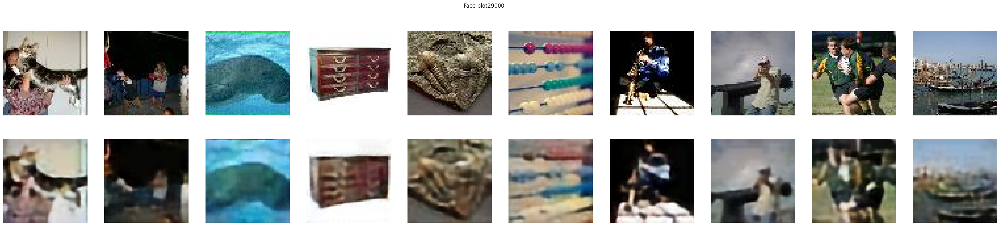

  6%|▉              | 30000/500000 [06:33<1:37:47, 80.11it/s, saving=2e+4]

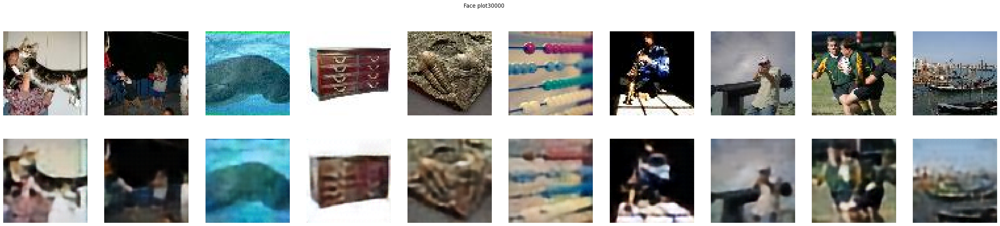

  6%|▉              | 30995/500000 [06:46<1:33:50, 83.30it/s, saving=3e+4]

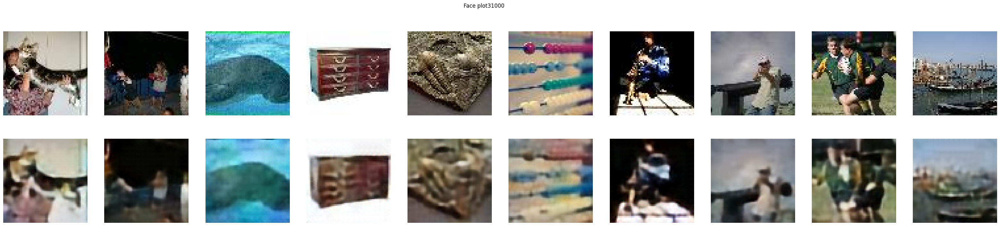

  6%|▉              | 31995/500000 [06:59<1:41:34, 76.80it/s, saving=3e+4]

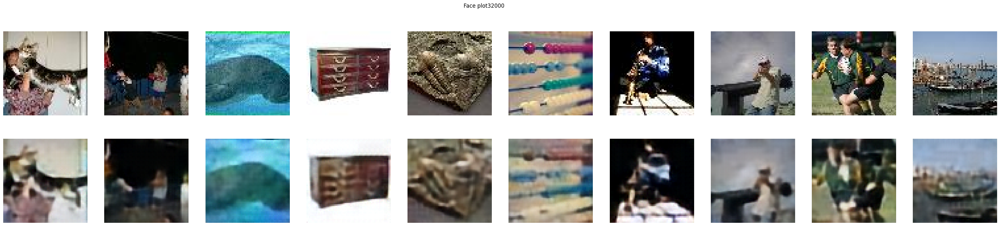

  7%|▉              | 32997/500000 [07:13<1:32:55, 83.76it/s, saving=3e+4]

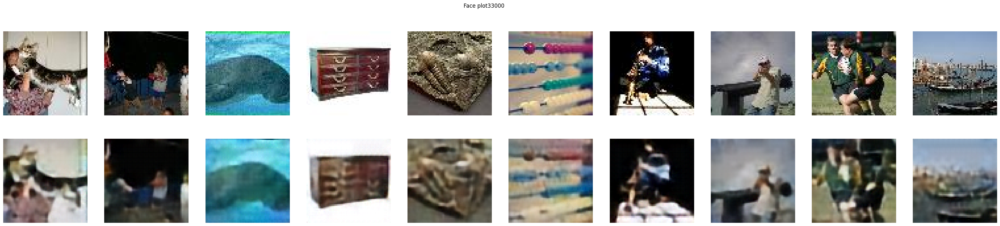

  7%|█              | 33997/500000 [07:25<1:36:11, 80.75it/s, saving=3e+4]

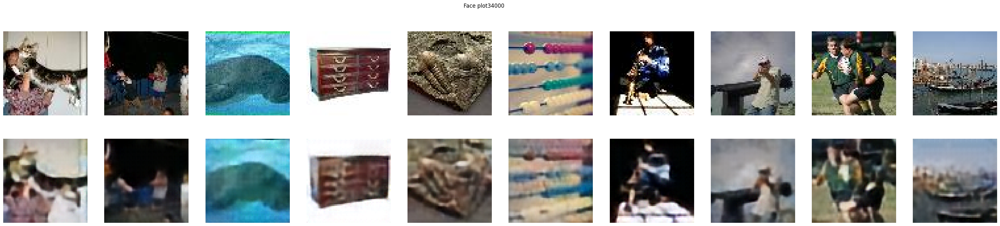

  7%|█              | 34998/500000 [07:39<1:43:41, 74.74it/s, saving=3e+4]

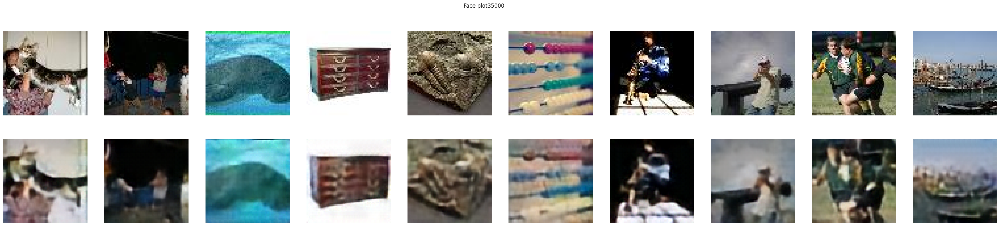

  7%|█              | 35998/500000 [07:52<1:33:50, 82.41it/s, saving=3e+4]

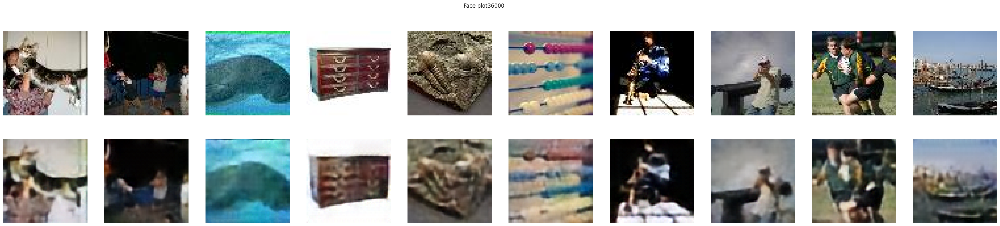

  7%|█              | 37000/500000 [08:05<1:40:29, 76.79it/s, saving=3e+4]

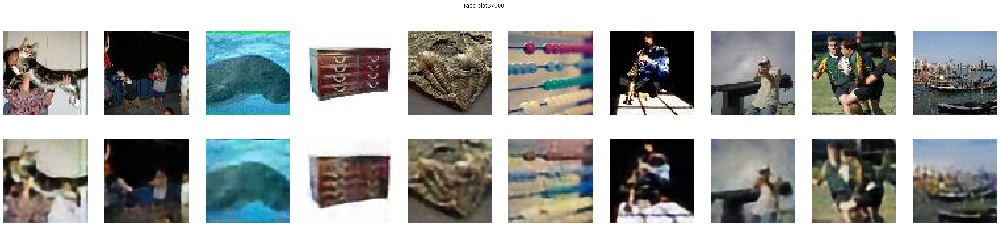

  8%|█▏             | 37996/500000 [08:18<1:33:41, 82.18it/s, saving=3e+4]

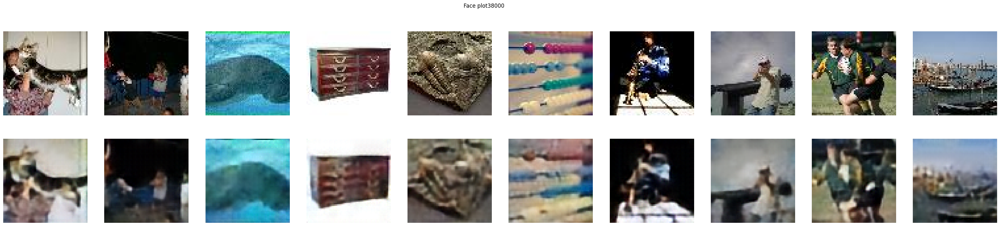

  8%|█▏             | 38992/500000 [08:31<1:36:50, 79.34it/s, saving=3e+4]

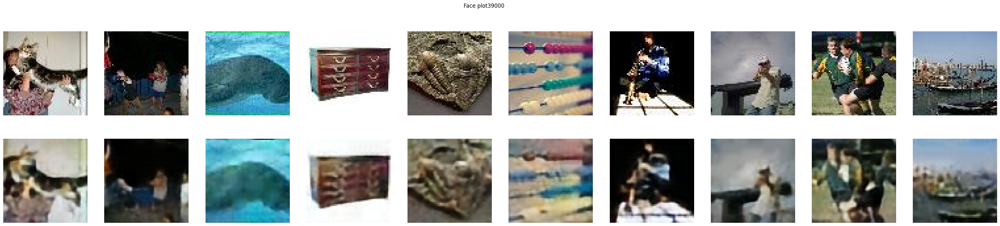

  8%|█▏             | 39998/500000 [08:44<1:37:47, 78.40it/s, saving=3e+4]

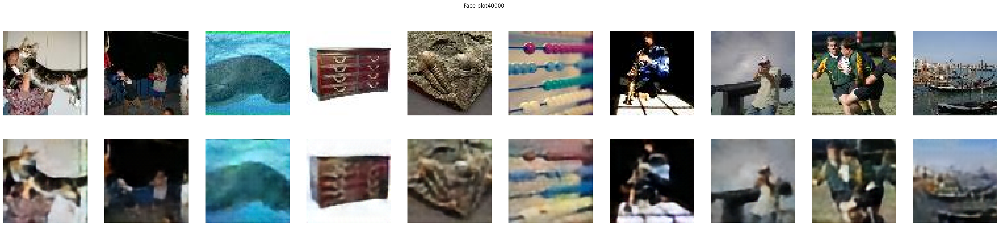

  8%|█▏             | 40997/500000 [08:57<1:34:57, 80.56it/s, saving=4e+4]

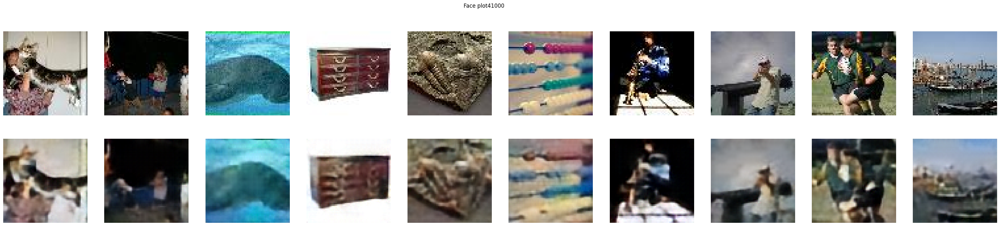

  8%|█▎             | 41996/500000 [09:09<1:35:00, 80.35it/s, saving=4e+4]

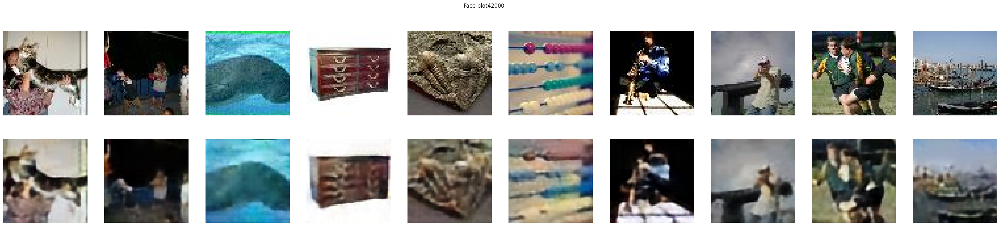

  9%|█▎             | 43000/500000 [09:22<1:35:57, 79.37it/s, saving=4e+4]

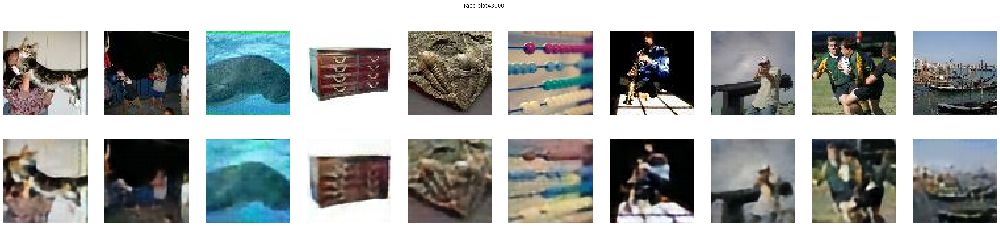

  9%|█▎             | 43999/500000 [09:35<1:37:21, 78.07it/s, saving=4e+4]

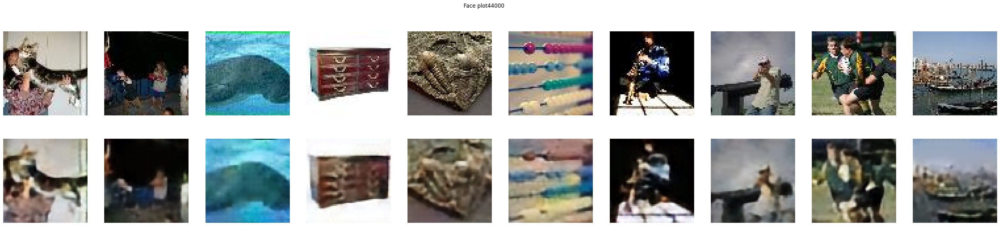

  9%|█▎             | 44997/500000 [09:49<1:35:47, 79.17it/s, saving=4e+4]

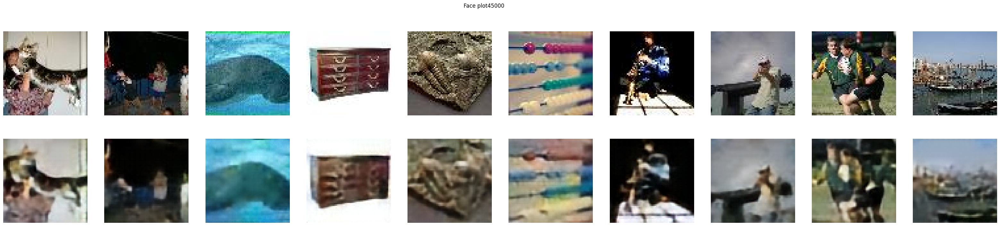

  9%|█▍             | 45999/500000 [10:02<1:34:24, 80.14it/s, saving=4e+4]

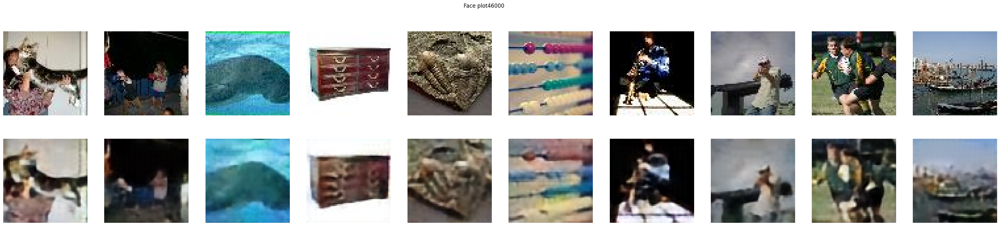

  9%|█▍             | 46992/500000 [10:15<1:30:58, 82.99it/s, saving=4e+4]

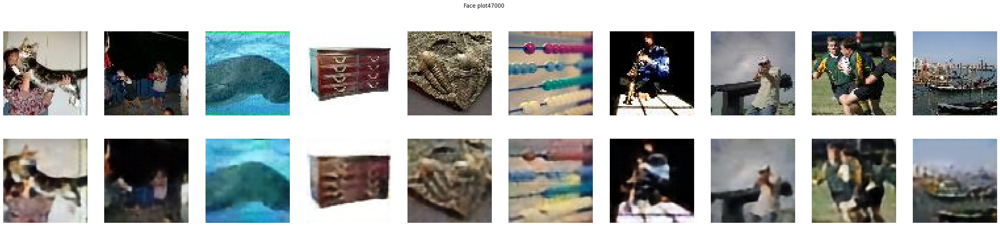

 10%|█▍             | 48000/500000 [10:28<1:31:52, 82.00it/s, saving=4e+4]

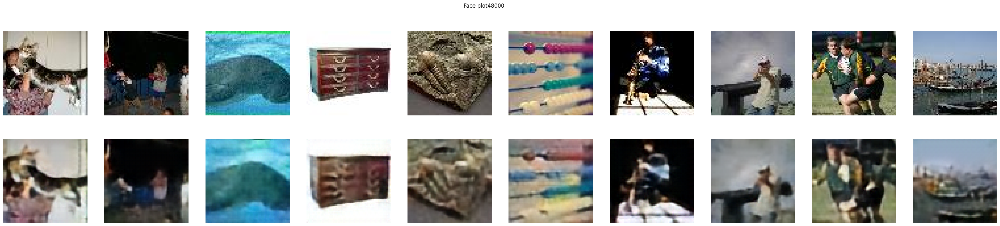

 10%|█▍             | 48992/500000 [10:41<1:35:45, 78.50it/s, saving=4e+4]

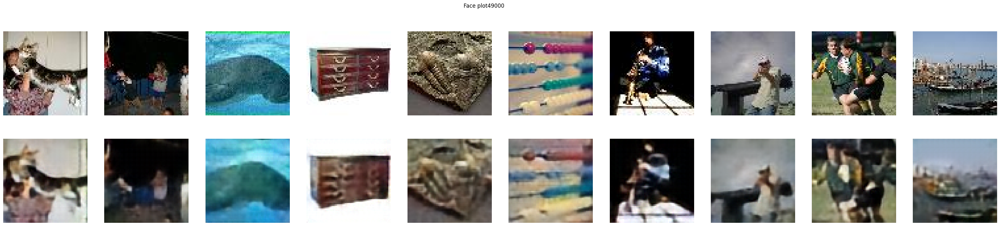

 10%|█▍             | 49221/500000 [10:44<1:33:10, 80.63it/s, saving=4e+4]

In [ ]:
"""
Set up optimizer and training loop
"""
optimizer = optim.Adam(model.parameters(), lr=args.learning_rate, amsgrad=True)

model.train()

from torch.utils.tensorboard import SummaryWriter

def train():
    writer = SummaryWriter()
    pbar = tqdm(range(args.n_updates), position=0)
    for i in pbar:
        (x, _) = next(iter(training_loader))
        x = x.to(device)
        optimizer.zero_grad(set_to_none=True)

        embedding_loss, x_hat, perplexity = model(x)
        recon_loss = torch.mean((x_hat - x)**2) / x_train_var
        loss = recon_loss + embedding_loss

        loss.backward()
        optimizer.step()
        results = {}

        results["recon_errors"] = recon_loss.item()
        results["perplexities"] = perplexity.item()
        results["loss_vals"] = loss.item()
        results["n_updates"] = i
        for k in results:
            writer.add_scalar(k, results[k], i)
        if i % 1000 == 0:
            show_image(i, 10,clip=True)
        if i % args.log_interval == 0:
            
            """
            save model and print values
            """
            if args.save:
                pbar.set_postfix({"saving":i})
                hyperparameters = args.__dict__
                utils.save_model_and_results(
                    model, results, hyperparameters, args.filename)

if __name__ == "__main__":
    train()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


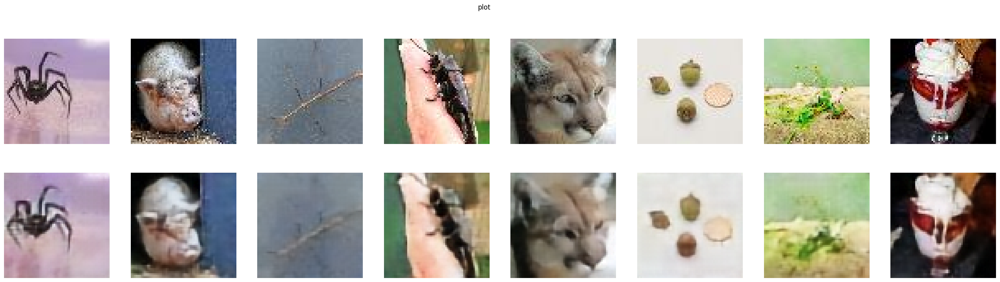

In [66]:
def show_image_random(dataset, id = 8, clip=False):
    f, axarr = plt.subplots(2, id, figsize=(id*4, 8))
    model.eval()
    scale_img = lambda x : (x+1)/2
    import random
    xxx = [random.randrange(len(dataset)) for i in range(id)]
    for i,di in enumerate(xxx):
        data = dataset[di][0]
        axarr[0][i].axis("off")
        axarr[0][i].imshow(scale_img(data.permute((1,2,0)).cpu().detach().numpy()))
        with torch.no_grad():
            _, output, _ = model(data.unsqueeze(0).to(device))
        if clip:
            output = torch.clip(output, min=-1,max=1)
        output = scale_img(output)
        output = output.squeeze(0).permute((1,2,0)).cpu().detach().numpy()
        axarr[1][i].axis("off")
        axarr[1][i].imshow(output)
    f.suptitle("plot")
    plt.show()
show_image_random(validation_data,id = 8, clip=False)

torch.Size([4, 64])

In [11]:
def get_encodings(dataset):
    encodings = []
    for (X,_) in tqdm(dataset):
        model.eval()
        tq, bq = model.get_encode(X)
        tq = tq.view((X.shape[0],-1))
        bq = bq.view((X.shape[0],-1))
        q = torch.cat([tq,bq], dim=1)
        encodings.append(q)
    return torch.cat(encodings, dim=0)
encodings = get_encodings(training_loader)

100%|███████████████████████████████████████| 2915/2915 [00:31<00:00, 93.78it/s]


In [12]:
np.save("data/tiny-imagenet/vq-vae-embedding.npy", encodings.cpu().detach().numpy())